# Darcy Flow 

Mapping: $a(x,y) \to u(x,y)$ where $u$ satisfies
$$-\nabla\cdot\bigl(a(x,y)\,\nabla u(x,y)\bigr) = f(x,y), \quad (x,y)\in[0,1]^2,$$
with Dirichlet boundary $u|_{\partial\Omega}=0$.

**Data**: two `.mat` files with fields `coeff` (permeability) and `sol` (pressure).

In [1]:
import sys, os
sys.path.insert(0, os.path.join(os.getcwd(), '..'))

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from mpl_toolkits.axes_grid1 import make_axes_locatable
from IPython.display import HTML
from sgpo.data.readers import MatReader

plt.rcParams.update({'figure.dpi': 120, 'font.size': 11, 'axes.titlesize': 13})

TRAIN_PATH = '/DATA/Sawan_projects/research/DATA/piececonst_r421_N1024_smooth1.mat'
TEST_PATH  = '/DATA/Sawan_projects/research/DATA/piececonst_r421_N1024_smooth2.mat'

In [2]:
reader_tr = MatReader(TRAIN_PATH)
coeff_tr = reader_tr.read_field('coeff').numpy()  # (N, h, w) or (N, s)
sol_tr   = reader_tr.read_field('sol').numpy()

reader_te = MatReader(TEST_PATH)
coeff_te = reader_te.read_field('coeff').numpy()
sol_te   = reader_te.read_field('sol').numpy()

print(f'Train – coeff: {coeff_tr.shape}, sol: {sol_tr.shape}')
print(f'Test  – coeff: {coeff_te.shape}, sol: {sol_te.shape}')
print(f'coeff range: [{coeff_tr.min():.4f}, {coeff_tr.max():.4f}]')
print(f'sol   range: [{sol_tr.min():.4f}, {sol_tr.max():.4f}]')

Train – coeff: (1024, 421, 421), sol: (1024, 421, 421)
Test  – coeff: (1024, 421, 421), sol: (1024, 421, 421)
coeff range: [3.0000, 12.0000]
sol   range: [-0.0000, 0.0178]


##  Sample Contour Plots: Permeability → Pressure

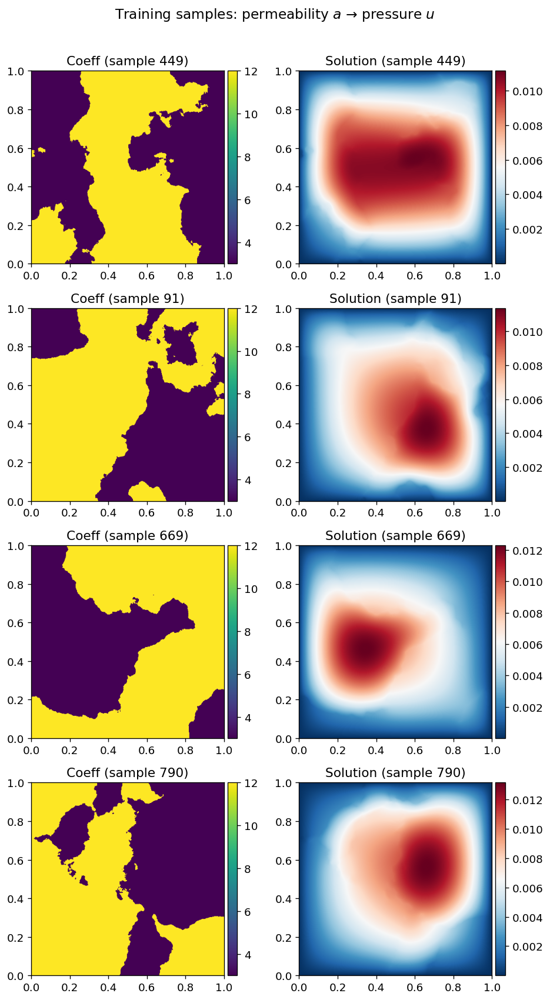

In [3]:
def plot_contour_pair(coeff, sol, idx, axes):
    """Plot a single coeff/sol pair as filled contours."""
    c = coeff[idx] if coeff.ndim == 3 else coeff[idx].reshape(int(np.sqrt(coeff.shape[1])), -1)
    s = sol[idx]   if sol.ndim == 3   else sol[idx].reshape(int(np.sqrt(sol.shape[1])), -1)
    for arr, ax, title, cmap in [
        (c, axes[0], f'Coeff (sample {idx})', 'viridis'),
        (s, axes[1], f'Solution (sample {idx})', 'RdBu_r'),
    ]:
        im = ax.imshow(arr, cmap=cmap, origin='lower', extent=[0,1,0,1])
        ax.set_title(title)
        divider = make_axes_locatable(ax)
        plt.colorbar(im, cax=divider.append_axes('right', size='5%', pad=0.05))

rng = np.random.default_rng(42)
idxs = rng.choice(coeff_tr.shape[0], 4, replace=False)

fig, axes = plt.subplots(4, 2, figsize=(8, 14))
for row, idx in enumerate(idxs):
    plot_contour_pair(coeff_tr, sol_tr, idx, axes[row])
fig.suptitle('Training samples: permeability $a$ → pressure $u$', fontsize=14, y=1.01)
fig.tight_layout()
plt.show()

##  Pointwise Statistics

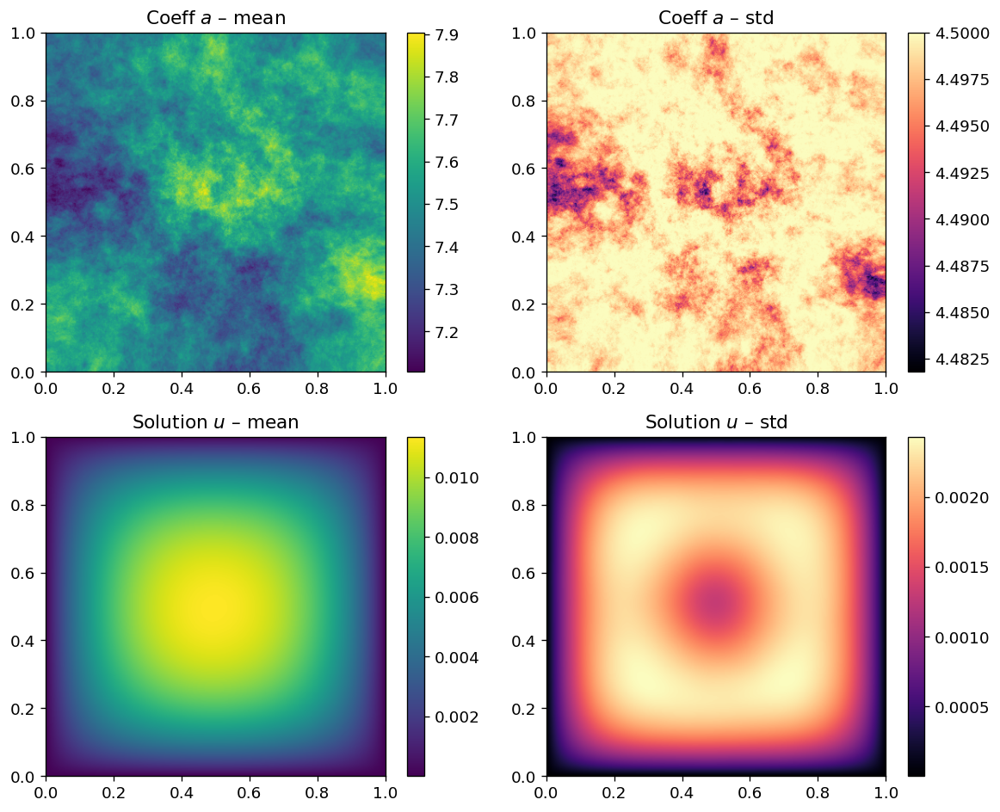

In [4]:
# Reshape to (N, H, W) if flattened
def _ensure_2d(arr):
    if arr.ndim == 2:
        s = int(np.sqrt(arr.shape[1]))
        return arr.reshape(-1, s, s)
    return arr

c2d = _ensure_2d(coeff_tr)
s2d = _ensure_2d(sol_tr)

fig, axes = plt.subplots(2, 2, figsize=(10, 8))
for row, (arr, name) in enumerate([(c2d, 'Coeff $a$'), (s2d, 'Solution $u$')]):
    mu = arr.mean(axis=0)
    sd = arr.std(axis=0)
    for col, (field, label, cmap) in enumerate([
        (mu, f'{name} – mean', 'viridis'),
        (sd, f'{name} – std', 'magma'),
    ]):
        im = axes[row, col].imshow(field, cmap=cmap, origin='lower', extent=[0,1,0,1])
        axes[row, col].set_title(label)
        plt.colorbar(im, ax=axes[row, col], fraction=0.046)
fig.tight_layout()
plt.show()

##  Value Distributions

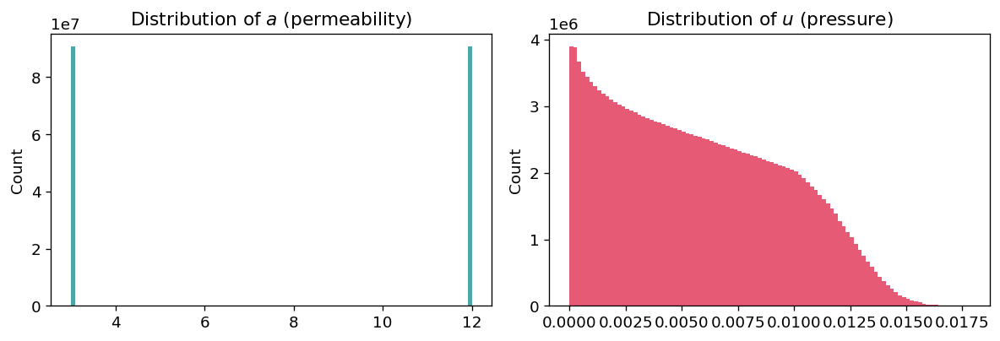

In [5]:
fig, axes = plt.subplots(1, 2, figsize=(10, 3.5))
axes[0].hist(coeff_tr.ravel(), bins=100, color='teal', alpha=0.7)
axes[0].set_title('Distribution of $a$ (permeability)')
axes[1].hist(sol_tr.ravel(), bins=100, color='crimson', alpha=0.7)
axes[1].set_title('Distribution of $u$ (pressure)')
for ax in axes: ax.set_ylabel('Count')
fig.tight_layout()
plt.show()

##  Animation: Scrolling Through Random Fields

In [6]:
n_anim = 40
anim_idxs = rng.choice(c2d.shape[0], n_anim, replace=False)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 4))
im1 = ax1.imshow(c2d[anim_idxs[0]], cmap='viridis', origin='lower', extent=[0,1,0,1])
im2 = ax2.imshow(s2d[anim_idxs[0]], cmap='RdBu_r', origin='lower', extent=[0,1,0,1])
ax1.set_title('Permeability $a$'); ax2.set_title('Pressure $u$')
plt.colorbar(im1, ax=ax1, fraction=0.046)
plt.colorbar(im2, ax=ax2, fraction=0.046)
title = fig.suptitle(f'Sample {anim_idxs[0]}')

vmin_c, vmax_c = c2d.min(), c2d.max()
vmin_s, vmax_s = s2d.min(), s2d.max()
im1.set_clim(vmin_c, vmax_c)
im2.set_clim(vmin_s, vmax_s)

def _update(frame):
    idx = anim_idxs[frame]
    im1.set_data(c2d[idx])
    im2.set_data(s2d[idx])
    title.set_text(f'Sample {idx}')
    return im1, im2, title

ani = animation.FuncAnimation(fig, _update, frames=n_anim, interval=350, blit=True)
plt.close(fig)
HTML(ani.to_jshtml())

##  2-D Spectral Energy

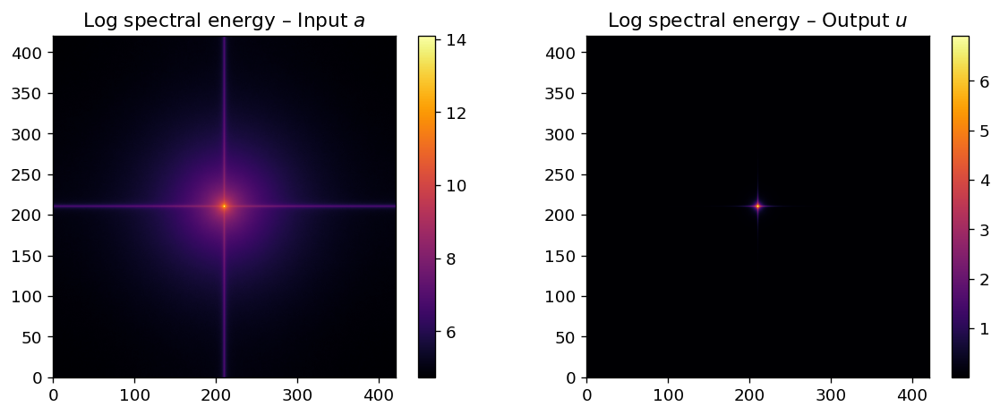

In [7]:
c_fft = np.abs(np.fft.fft2(c2d)).mean(axis=0)
s_fft = np.abs(np.fft.fft2(s2d)).mean(axis=0)

fig, axes = plt.subplots(1, 2, figsize=(10, 4))
for arr, ax, title in [(c_fft, axes[0], 'Input $a$'), (s_fft, axes[1], 'Output $u$')]:
    shifted = np.fft.fftshift(np.log1p(arr))
    im = ax.imshow(shifted, cmap='inferno', origin='lower')
    ax.set_title(f'Log spectral energy – {title}')
    plt.colorbar(im, ax=ax, fraction=0.046)
fig.tight_layout()
plt.show()

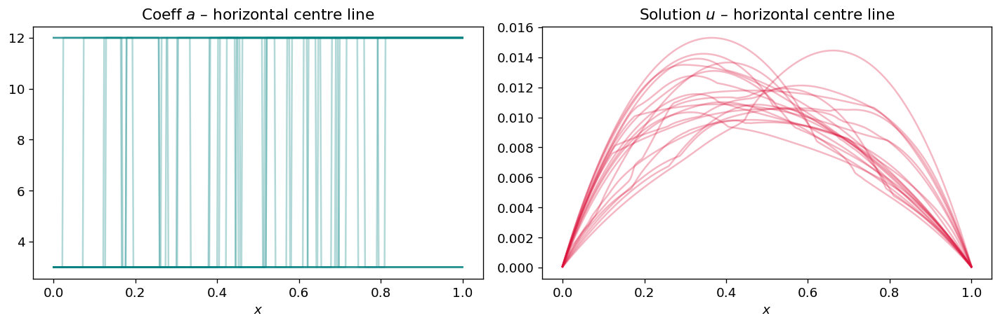

In [8]:
mid = c2d.shape[1] // 2
xs = np.linspace(0, 1, c2d.shape[2])

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
for i in range(min(20, c2d.shape[0])):
    axes[0].plot(xs, c2d[i, mid, :], alpha=0.3, color='teal')
    axes[1].plot(xs, s2d[i, mid, :], alpha=0.3, color='crimson')
axes[0].set_title('Coeff $a$ – horizontal centre line')
axes[1].set_title('Solution $u$ – horizontal centre line')
for ax in axes: ax.set_xlabel('$x$')
fig.tight_layout()
plt.show()